# Setup



In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 CPU


# Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive
 Biggie
'Colab Notebooks'
'Copy of Whiteboard Warriors #21 - Group 1 .gdoc'
 DATA
'Data Science Notes.gdoc'
'Deep Learning with PyTorch Chapter 1+2 notes.gdoc'
'Deep Learning with PyTorch Chapter 3 notes.gdoc'
'Hadoop Tutorial.gdoc'
'How to Efficiently Learn Your Next Thing.gdoc'
'Job Search'
'Mentor Meeting Agendas.gdoc'
 Modules
 Networking
'Presenting from a Jupyter Notebook.gdoc'
'R Notes.gdoc'
'Setting up a virtual environment.gdoc'
 Tailgate
'Thinkful D

In [3]:
# copy the .zip file into the root directory of cloud VM
!cp /mydrive/yolov5/yolov5_tailgate_train.zip /content/


In [ ]:
#unzip
%cd /content/
!unzip /content/yolov5_tailgate_train.zip
%cd ./yolov5

In [5]:
!ls

data	    hubconf.py	models		  test.py	  utils
detect.py   inference	README.md	  train.py	  weights
Dockerfile  LICENSE	requirements.txt  tutorial.ipynb


In [6]:
!cp /mydrive/yolov5/tailgate_train.yaml data/

# Train


In [ ]:
# We're going to convert the class index on the .txt files. As we're working with only one class, it's supposed to be class 0.
# If the index is different from 0 then we're going to change it.
import glob
import re

txt_file_paths = glob.glob(r"../train/labels/*.txt")
for i, file_path in enumerate(txt_file_paths):
    # get image size
    with open(file_path, "r") as f_o:
        lines = f_o.readlines()

        text_converted = []
        for line in lines:
            print(line)
            numbers = re.findall("[0-9.]+", line)
            print(numbers)
            if numbers:

                # Define coordinates
                text = "{} {} {} {} {}".format(0, numbers[1], numbers[2], numbers[3], numbers[4])
                text_converted.append(text)
                print(i, file_path)
                print(text)
        # Write file
        with open(file_path, 'w') as fp:
            for item in text_converted:
                fp.writelines("%s\n" % item)
                
#### FUTURE UPDATE: WRITE CODE THAT BYPASSES CLASSES.TXT ##### 

Train a YOLOv5s model on coco128 by specifying model config file `--cfg models/yolo5s.yaml`, and dataset config file `--data data/coco128.yaml`. Start training from pretrained `--weights yolov5s.pt`, or from randomly initialized `--weights ''`. Pretrained weights are auto-downloaded from [Google Drive](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J).

**All training results are saved to `runs/exp0`** for the first experiment, then `runs/exp1`, `runs/exp2` etc. for subsequent experiments.


In [15]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 334), started 0:54:20 ago. (Use '!kill 334' to kill it.)

<IPython.core.display.Javascript object>

In [10]:
# Train YOLOv5s on tailgate data
!python train.py --batch 16 --epochs 1000 --data tailgate_train.yaml --cfg yolov5s.yaml --weights yolov5s.pt --name tailgate --nosave --cache

Streaming output truncated to the last 5000 lines.
                 all          98         103           0           0    0.000677    0.000104

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     1/999     4.57G    0.1225   0.01488         0    0.1374         1       640: 100% 7/7 [00:02<00:00,  3.12it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 7/7 [00:02<00:00,  3.47it/s]
                 all          98         103           0           0    0.000607    9.38e-05

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     2/999     4.57G    0.1138   0.01512         0    0.1289         3       640: 100% 7/7 [00:02<00:00,  3.11it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 7/7 [00:02<00:00,  3.50it/s]
                 all          98         103           0           0    0.000408     5.3e-05

     Epoch   gpu_

# Visualize

View `runs/exp0/train*.jpg` images to see training images, labels and augmentation effects. A **Mosaic Dataloader** is used for training (shown below), a new concept developed by Ultralytics and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

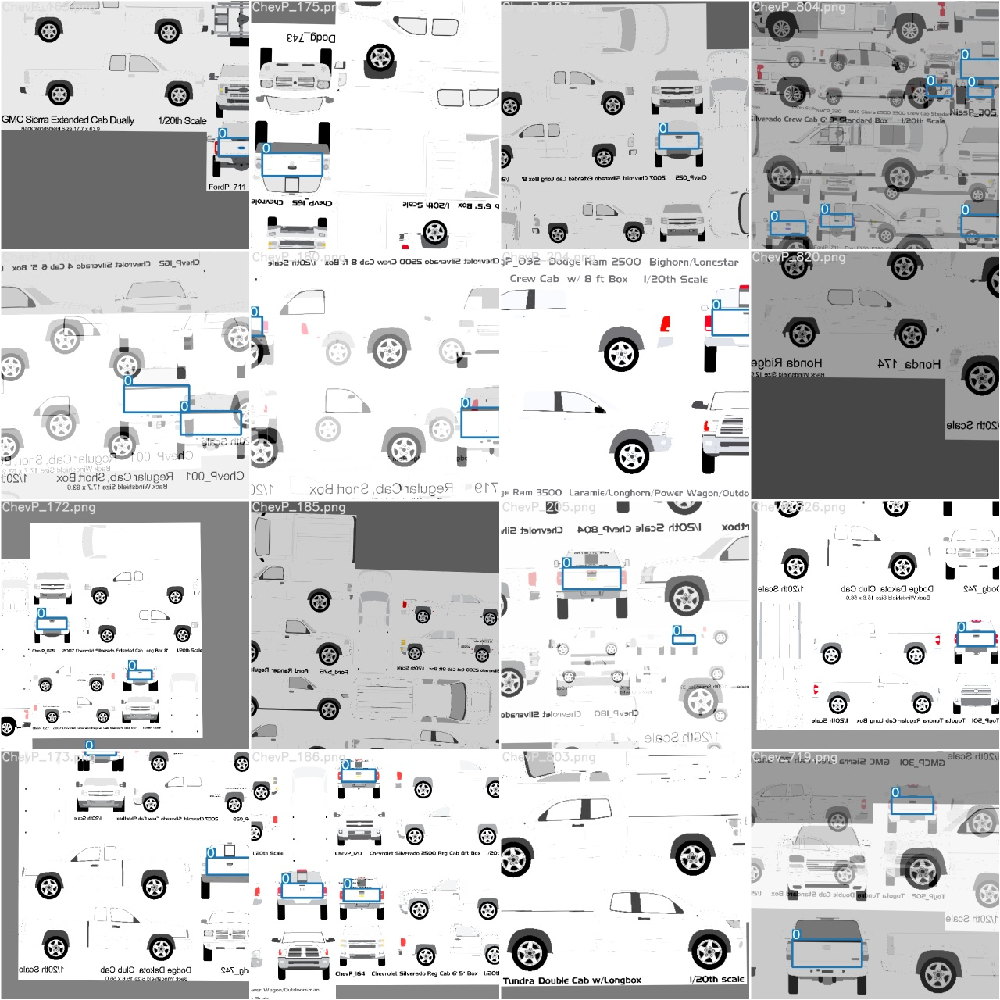

In [11]:
Image(filename='./runs/exp0_tailgate/train_batch1.jpg', width=900)  # view augmented training mosaics

View `test_batch0_gt.jpg` to see test batch 0 *ground truth* labels.

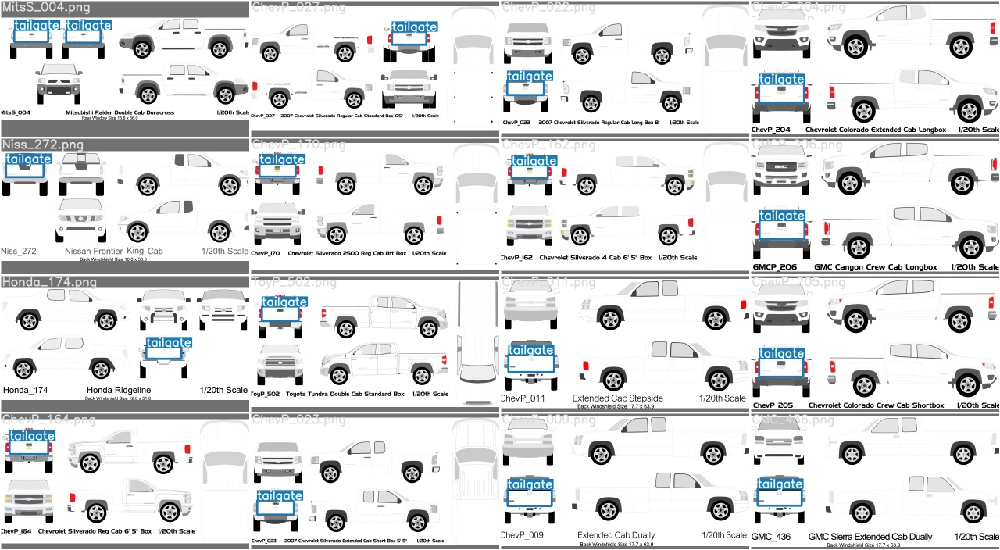

In [12]:
Image(filename='runs/exp0_tailgate/test_batch0_gt.jpg', width=900)  # view test image labels

View `test_batch0_pred.jpg` to see test batch 0 *predictions*.

In [ ]:
# for some reaons the bboxes aren't recorded here, but they are when using detect.py
Image(filename='runs/exp0_tailgate/test_batch0_pred.jpg', width=900)  # view test image predictions

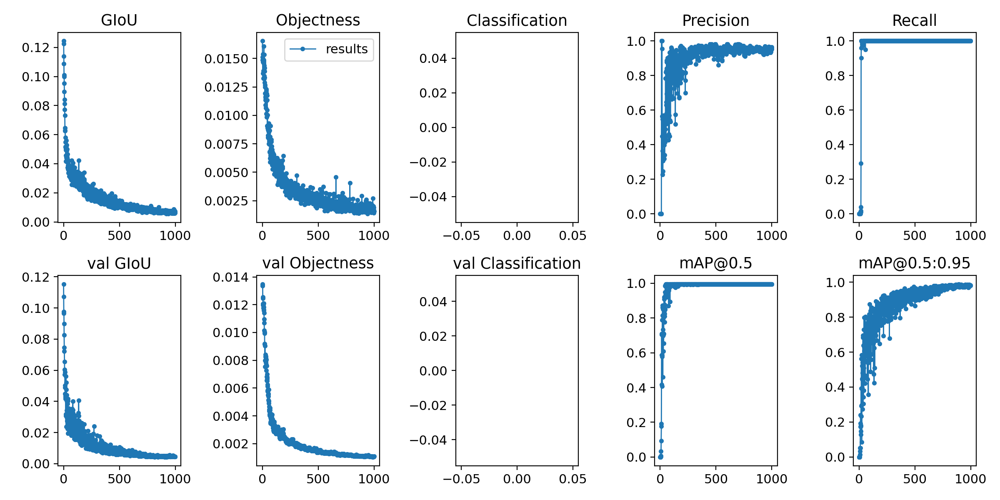

In [16]:
Image(filename='runs/exp0_tailgate/results.png', width=900)

Training losses and performance metrics are saved to Tensorboard and also to a `runs/exp0/results.txt` logfile. `results.txt` is plotted as `results.png` after training completes. Partially completed `results.txt` files can be plotted with `from utils.general import plot_results; plot_results()`.

# Detection and Testing


In [ ]:
# import and unzip test set
!cp /mydrive/yolov5/tailgate_test_set.zip ../

%cd ../
!mkdir ./test_set/
!mkdir ./test_set/model_output/
# unzipping file into the test_set folder
%cd ./test_set
!unzip ../tailgate_test_set.zip
# getting back to yolo folder 
%cd ../yolov5

In [28]:
def detection():
  !python detect.py --weights /mydrive/yolov5/last_tailgate.pt --source ../test_set/{truck_name}.png

In [31]:
import glob
import threading

# gather all pngs
test_set = glob.glob('/content/test_set/*.png')

# loop through each file to
for i in range(len(test_set)):
  # extract the file and truck name
  file_split = test_set[i].split('/')[-1]
  truck_name = file_split.split('.')[-2]
  # run the prediction
  #t = !python detect.py --weights /mydrive/yolov5/last_tailgate.pt --source ../test_set/{truck_name}.png
  thread = threading.Thread(target=detection)
  thread.start()
  
  thread.join()
  !mv ./inference/output/{truck_name}.png ../test_set/model_output/{truck_name}_pred.png

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='../test_set/GMCP_028.png', update=False, view_img=False, weights=['/mydrive/yolov5/last_tailgate.pt'])
Using CPU

Fusing layers... 
Model Summary: 140 layers, 7.24652e+06 parameters, 6.61683e+06 gradients
image 1/1 /content/test_set/GMCP_028.png: 384x640 1 tailgates, Done. (0.312s)
Results saved to inference/output
Done. (1.034s)
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='../test_set/FordP_605.png', update=False, view_img=False, weights=['/mydrive/yolov5/last_tailgate.pt'])
Using CPU

Fusing layers... 
Model Summary: 140 layers, 7.24652e+06 parameters, 6.61683e+06 gradients
image 1/1 /content/test_set/FordP_605.png: 512x640 2 tailgates, Done. (0.421s)
Results saved to inference/output
Done. (0.994s)
Na

In [35]:
!zip /mydrive/yolov5/inference/model_output.zip ../test_set/model_output/*.png

  adding: ../test_set/model_output/Chev_951_pred.png (deflated 27%)
  adding: ../test_set/model_output/ChevP_020_pred.png (deflated 34%)
  adding: ../test_set/model_output/ChevP_021_pred.png (deflated 33%)
  adding: ../test_set/model_output/ChevP_024_pred.png (deflated 34%)
  adding: ../test_set/model_output/ChevP_030_pred.png (deflated 30%)
  adding: ../test_set/model_output/ChevP_161_pred.png (deflated 35%)
  adding: ../test_set/model_output/ChevP_181_pred.png (deflated 35%)
  adding: ../test_set/model_output/ChevP_182_pred.png (deflated 37%)
  adding: ../test_set/model_output/ChevP_183_pred.png (deflated 37%)
  adding: ../test_set/model_output/ChevP_206_pred.png (deflated 25%)
  adding: ../test_set/model_output/ChevP_802_pred.png (deflated 33%)
  adding: ../test_set/model_output/ChevP_805_pred.png (deflated 28%)
  adding: ../test_set/model_output/Dodg_675_pred.png (deflated 27%)
  adding: ../test_set/model_output/Dodg_677_pred.png (deflated 28%)
  adding: ../test_set/model_output/Do